In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import sklearn
from plotly.subplots import make_subplots
import plotly.express as px

In [ ]:
df_2002=pd.read_csv("../final_csv/2002.csv")
df_2012=pd.read_csv("../final_csv/2012.csv")
df_2022=pd.read_csv("../final_csv/2022.csv")

In [3]:
print(df_2002.shape)
print(df_2012.shape)
print(df_2022.shape)

(46638, 70)
(61754, 70)
(45762, 70)


### Summary Statistics of some descriptive variables 


In [351]:
summary_stats = []

for data, year in [(df_2002, 2002), (df_2012, 2012), (df_2022, 2022)]:
    total = len(data)
    female_count = len(data[data['sex'] == 'Female'])
    male_count = len(data[data['sex'] == 'Male'])
    
    clean_age = data.dropna(subset=["age"])
    clean_country = data.dropna(subset=["country"])
    
    summary_stats.append({
        'Year': year,
        'Total Respondents': total,
        'Female %': f"{(female_count/total*100):.1f}%",
        'Male %': f"{(male_count/total*100):.1f}%",
        'Mean Age': f"{clean_age['age'].mean():.1f}",
        'Median Age': f"{clean_age['age'].median():.0f}",
        'Age Std Dev': f"{clean_age['age'].std():.1f}",
        'Num Countries': clean_country['country'].nunique()
    })

summary_df = pd.DataFrame(summary_stats)
summary_df

,Year,Total Respondents,Female %,Male %,Mean Age,Median Age,Age Std Dev,Num Countries
0,2002,46638,55.7%,44.3%,45.4,44,17.0,35
1,2012,61754,53.5%,46.4%,47.9,47,17.4,41
2,2022,45762,54.1%,45.6%,49.6,50,17.8,32


## Exploratory Data Analysis (EDA) on Factor Scores

In this section, we perform basic exploratory data analysis on the dataset which includes the following variables

- Sex 
- Age
- Marital Status
- Country
- Work Hours of Respondent and Spouse (Household work and Paid work)
- Education Level of Respondent
- Income sharing between partners
- Number of adults and children in the family
- Item level responses to survery questions with Likert-type scale

The analyses include:
- Distribution of variables
- Group-wise comparisons of variables (e.g., by gender, education, or country)
- Summary statistics such as mean, standard deviation, and confidence intervals


In [353]:
## Defining a color map for genders
gender_color_map = {"Female":"#f678a7", "Male": "#add2e4"}

In [354]:
df_2002['sex'].unique()

array(['Female', 'Male', nan], dtype=object)

In [355]:
## Gender Distribution
fig = make_subplots(rows=1, cols=3, subplot_titles=("2002", "2012", "2022"))
for idx, (data, year) in enumerate([(df_2002, "2002"), (df_2012, "2012"), (df_2022, "2022")], start=1):
    clean = data.dropna(subset=["sex"])
    counts = clean["sex"].value_counts()
    total = counts.sum()
    perc = (counts / total * 100).reindex(["Female", "Male"])
    colors=[gender_color_map[g] for g in perc.index]
    fig.add_trace(
        go.Bar(
            x=perc.index,
            y=perc.values,
            text=[f"{v:.1f}%" for v in perc.values],
            textposition="outside",
            marker=dict(color=colors)
        ),
        row=1, col=idx
    )
fig.update_layout(
    height=500, width=1500,
    showlegend=False,
    uniformtext_minsize=8,
    bargap=0.25,
    title='Gender Distribution across years'
)

fig.update_xaxes(categoryorder="array", categoryarray=["Female", "Male"], title_text="Gender")
fig.update_yaxes(range=[0, 100], title_text="Percentage")
fig.show()

In [356]:
## Age Distribution
age_labels = ["18-25", "26-35", "36-45", "46-55", "56-65", "66-75", "75+"]

fig = make_subplots(rows=1, cols=3, subplot_titles=("2002", "2012", "2022"))
for idx, (data, year) in enumerate([(df_2002, "2002"), (df_2012, "2012"), (df_2022, "2022")], start=1):
    clean = data.dropna(subset=["age_bin"]).copy()
    counts = clean["age_bin"].value_counts()
    total = counts.sum()
    percentages = (counts / total * 100).reindex(age_labels)
    fig.add_trace(
        go.Bar(
            x=percentages.index,
            y=percentages.values,
            marker_color="#4c72b0",
            text=[f"{v:.1f}%" for v in percentages.values],
            textposition="outside"
        ),
        row=1, col=idx
    )
fig.update_layout(
    height=600, width=1500,
    showlegend=False,
    uniformtext_minsize=8,
    bargap=0.25,
    title='Age Distribution Across Years'
)
fig.update_xaxes(categoryorder="array", tickangle=45, title_text="Age Group")
fig.update_yaxes(title_text="Percentage")
fig.show()

In [357]:
fig = make_subplots(rows=1, cols=3, subplot_titles=("2002", "2012", "2022"))


for idx, (data, year) in enumerate([(df_2002, "2002"), (df_2012, "2012"), (df_2022, "2022")], start=1):
    clean = data.dropna(subset=["sex", "age"])
    
    for gender in ["Female", "Male"]:
        gender_data = clean[clean["sex"] == gender]["age"]
        fig.add_trace(
            go.Histogram(
                x=gender_data,
                name=gender,
                marker_color=gender_color_map[gender],
                opacity=1,
                showlegend=(idx == 1),
                nbinsx=30
            ),
            row=1, col=idx
        )

fig.update_layout(
    height=400, width=1500,
    barmode='overlay',
    title='Age Distribution by Gender Across Years'
)
fig.update_xaxes(title_text="Age")
fig.update_yaxes(title_text="Count")
fig.show()

In [358]:
fig = make_subplots(rows=1, cols=3, subplot_titles=("2002", "2012", "2022"))

age_labels = ["18-25", "26-35", "36-45", "46-55", "56-65", "66-75", "75+"]

for idx, (data, year) in enumerate([(df_2002, "2002"), (df_2012, "2012"), (df_2022, "2022")], start=1):
    clean = data.dropna(subset=["sex", "age_bin"]).copy()
    
    # Calculate percentage by age group
    age_sex = clean.groupby(['age_bin', 'sex']).size().unstack(fill_value=0)
    age_sex_pct = age_sex.div(age_sex.sum(axis=1), axis=0) * 100
    age_sex_pct = age_sex_pct.reindex(age_labels)
    
    for sex in ['Female', 'Male']:
        if sex in age_sex_pct.columns:
            fig.add_trace(
                go.Bar(
                    name=sex,
                    x=age_sex_pct.index,
                    y=age_sex_pct[sex],
                    marker_color=gender_color_map[sex],
                    showlegend=(idx == 1)
                ),
                row=1, col=idx
            )

fig.update_layout(
    height=500, width=1500,
    barmode='stack',
    title='Gender Distribution by Age Group Across Years'
)
fig.update_xaxes(title_text="Age Group", tickangle=45)
fig.update_yaxes(title_text="Percentage", range=[0, 100])
fig.show()

In [359]:
import pycountry

def get_country_name(country_code):
    try:
        return pycountry.countries.get(alpha_2=country_code).name
    except:
        return country_code 

fig = make_subplots(
    rows=1, cols=3,
    specs=[[{"type": "treemap"}, {"type": "treemap"}, {"type": "treemap"}]],
    subplot_titles=("2002", "2012", "2022")
)

for idx, (data, year) in enumerate([(df_2002, "2002"), (df_2012, "2012"), (df_2022, "2022")], start=1):
    clean = data.dropna(subset=["country"])
    
    country_counts = clean['country'].value_counts().sort_values(ascending=False)
    total = country_counts.sum()
    country_pct = (country_counts / total * 100)
    country_names = [get_country_name(code) for code in country_counts.index]
    
    fig.add_trace(
    go.Treemap(
        labels=country_names,
        parents=[""] * len(country_names),
        values=country_counts.values,
        marker=dict(
            colors=country_counts.values,
            colorscale="Viridis",
            line=dict(width=2, color="white")
        ),
        text=[
            f"<b>{name}</b><br>{pct:.1f}%"
            for name, pct in zip(country_names, country_pct.values)
        ],
        textposition="middle center",
        textfont=dict(size=11, color="white"),
        hovertemplate=(
            "<b>%{label}</b><br>"
            "Respondents: %{value}<br>"
            "Percentage: %{customdata:.1f}%"
            "<extra></extra>"
        ),
        customdata=country_pct.values
    ),
    row=1, col=idx
)
    
fig.show()


In [360]:
fig = make_subplots(rows=1, cols=3, subplot_titles=("2002", "2012", "2022"))

for idx, (data, year) in enumerate([(df_2002, "2002"), (df_2012, "2012"), (df_2022, "2022")], start=1):
    clean = data.dropna(subset=["country"])
    
    # Calculate percentages by country
    country_counts = clean['country'].value_counts()
    total = country_counts.sum()
    country_pct = (country_counts / total * 100).sort_index()
    
    fig.add_trace(
        go.Bar(
            x=country_pct.index,
            y=country_pct.values,
            marker_color="#4c72b0",
            text=[f"{v:.1f}%" for v in country_pct.values],
            textposition="outside"
        ),
        row=1, col=idx
    )

fig.update_layout(
    height=600, width=2400,
    showlegend=False,
    title='Respondent Distribution by Country Across Years',
    margin=dict(b=150)
)
fig.update_xaxes(title_text="Country", tickangle=90)
fig.update_yaxes(title_text="Percentage")
fig.show()

In [361]:
fig = make_subplots(rows=1, cols=3, subplot_titles=("2002", "2012", "2022"))

for idx, (data, year) in enumerate([(df_2002, "2002"), (df_2012, "2012"), (df_2022, "2022")], start=1):
    clean = data.dropna(subset=["age", "country"])
    
    # Calculate average age by country
    avg_age = clean.groupby('country')['age'].mean().sort_index()
    
    fig.add_trace(
        go.Bar(
            x=avg_age.index,
            y=avg_age.values,
            marker_color="#4c72b0",
            text=[f"{v:.1f}" for v in avg_age.values],
            textposition="outside"
        ),
        row=1, col=idx
    )

fig.update_layout(
    height=600, width=2400,
    showlegend=False,
    title='Average Age by Country Across Years',
    margin=dict(b=150)
)
fig.update_xaxes(title_text="Country", tickangle=90)
fig.update_yaxes(title_text="Average Age")
fig.show()

In [362]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(
    rows=1,
    cols=3,
    subplot_titles=("2002", "2012", "2022")
)

for idx, (data, year) in enumerate(
    [(df_2002, "2002"), (df_2012, "2012"), (df_2022, "2022")],
    start=1
):
    clean = data.dropna(subset=["sex", "country"])
    
    country_sex = clean.groupby(['country', 'sex']).size().unstack(fill_value=0)
    country_sex_pct = country_sex.div(country_sex.sum(axis=1), axis=0) * 100
    
    country_sex_pct = country_sex_pct.sort_index()
    
    for sex in ['Female', 'Male']:
        if sex in country_sex_pct.columns:
            fig.add_trace(
                go.Bar(
                    name=sex,
                    x=country_sex_pct.index,
                    y=country_sex_pct[sex],
                    marker_color=gender_color_map[sex],
                    showlegend=(idx == 1)
                ),
                row=1,
                col=idx
            )
for col in [1, 2, 3]:
    fig.add_hline(
        y=50,
        row=1,
        col=col,
        line_dash="dash",
        line_color="black",
        line_width=2,
        annotation_text="50%",
        annotation_position="top left",
        annotation_font_size=10
    )

fig.update_layout(
    height=600,
    width=2400,
    barmode='stack',
    uniformtext_minsize=8,
    bargap=0.25,
    title='Gender Distribution by Country Across Years',
    margin=dict(b=150)
)

fig.update_xaxes(
    tickangle=90,
    title_text="Country"
)

fig.update_yaxes(
    title_text="Percentage",
    range=[0, 100]
)

fig.show()


### Analysis on Marital status

In [363]:
# Marital status distribution by gender (percentages)
fig = make_subplots(rows=1, cols=3, subplot_titles=("2002", "2012", "2022"))
marital_order = ['Single', 'Married', 'Separated', 'Divorced', 'Widowed']
marital_order_12_22 = ['Single', 'Married', 'Civil partnership', 'Divorced', 'Widowed']

for idx, (data, year) in enumerate([(df_2002, "2002"), (df_2012, "2012"), (df_2022, "2022")], start=1):
    clean = data.dropna(subset=["marital", "sex"])
    
    for gender in ["Female", "Male"]:
        gender_data = clean[clean["sex"] == gender]["marital"]
        value_counts = gender_data.value_counts()
        total = value_counts.sum()
        if year=='2012' or year=='2022':
            percentages = (value_counts / total * 100).reindex(marital_order_12_22, fill_value=0)
        else:
            percentages = (value_counts / total * 100).reindex(marital_order, fill_value=0)

        
        fig.add_trace(
            go.Bar(
                x=percentages.index,
                y=percentages.values,
                name=gender,
                marker_color=gender_color_map[gender],
                opacity=0.7,
                showlegend=(idx == 1),
                text=[f"{v:.1f}%" for v in percentages.values],
                textposition="outside"
            ),
            row=1, col=idx
        )

fig.update_layout(
    height=500, width=1800,
    barmode='group',
    title='Marital Status Distribution by Gender Across Years'
)
fig.update_xaxes(title_text="Marital Status", tickangle=45)
fig.update_yaxes(title_text="Percentage")
fig.show()

In [364]:
# Gender distribution within each marital status category (percentages)
fig = make_subplots(rows=1, cols=3, subplot_titles=("2002", "2012", "2022"))
marital_order = ['Single', 'Married', 'Divorced', 'Widowed']
marital_order_12_22 = ['Single', 'Married', 'Divorced', 'Widowed',"Civil Partnership"]

for idx, (data, year) in enumerate([(df_2002, "2002"), (df_2012, "2012"), (df_2022, "2022")], start=1):
    clean = data.dropna(subset=["marital", "sex"])
    
    # Calculate percentage by marital status category
    marital_sex = clean.groupby(['marital', 'sex']).size().unstack(fill_value=0)
    marital_sex_pct = marital_sex.div(marital_sex.sum(axis=1), axis=0) * 100
    if year=="2012" or year=='2022':
       marital_sex_pct = marital_sex_pct.reindex(marital_order_12_22)
    else:
          marital_sex_pct = marital_sex_pct.reindex(marital_order) 
    
    for gender in ['Female', 'Male']:
        if gender in marital_sex_pct.columns:
            fig.add_trace(
                go.Bar(
                    name=gender,
                    x=marital_sex_pct.index,
                    y=marital_sex_pct[gender],
                    marker_color=gender_color_map[gender],
                    showlegend=(idx == 1)
                ),
                row=1, col=idx
            )

fig.update_layout(
    height=500, width=1800,
    barmode='stack',
    title='Gender Distribution within Each Marital Status Category Across Years'
)
fig.update_xaxes(title_text="Marital Status", tickangle=45)
fig.update_yaxes(title_text="Percentage", range=[0, 100])
fig.show()

In [365]:
# Marital status distribution by age group (percentages)
fig = make_subplots(rows=1, cols=3, subplot_titles=("2002", "2012", "2022"))

age_labels = ["<18","18-25", "26-35", "36-45", "46-55", "56-65", "66-75", "75+"]
marital_order = ['Single', 'Married', 'Separated', 'Divorced', 'Widowed']
marital_colors = {
    'Single': '#4c78a8',
    'Married': '#f28e2b',
    'Separated': '#59a14f',
    'Divorced': '#e15759',
    'Widowed': '#b07aa1'
}

for idx, (data, year) in enumerate([(df_2002, "2002"), (df_2012, "2012"), (df_2022, "2022")], start=1):
    clean = data.dropna(subset=["age_bin", "marital"]).copy()
    clean['age_bin'] = pd.Categorical(clean['age_bin'], categories=age_labels, ordered=True)
    
    # Calculate percentage by age group
    age_marital = clean.groupby(['age_bin', 'marital']).size().unstack(fill_value=0)
    age_marital_pct = age_marital.div(age_marital.sum(axis=1), axis=0) * 100
    age_marital_pct = age_marital_pct.reindex(marital_order, axis=1, fill_value=0)
    
    for marital_status in marital_order:
        if marital_status in age_marital_pct.columns:
            fig.add_trace(
                go.Bar(
                    name=marital_status,
                    x=age_marital_pct.index,
                    y=age_marital_pct[marital_status],
                    marker_color=marital_colors[marital_status],
                    showlegend=(idx == 1),
                    text=[f"{v:.1f}%" for v in age_marital_pct[marital_status]],
                    textposition="inside"
                ),
                row=1, col=idx
            )

fig.update_layout(
    height=600, width=2000,
    barmode='stack',
    title='Marital Status Distribution by Age Group Across Years',
    legend_title_text='Marital Status'
)
fig.update_xaxes(title_text="Age Group", tickangle=45)
fig.update_yaxes(title_text="Percentage", range=[0, 100])
fig.show()

/var/folders/7h/y6lh43p93vl_bgy8rc2z416c0000gn/T/ipykernel_1759/1817674101.py:19: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/7h/y6lh43p93vl_bgy8rc2z416c0000gn/T/ipykernel_1759/1817674101.py:19: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/7h/y6lh43p93vl_bgy8rc2z416c0000gn/T/ipykernel_1759/1817674101.py:19: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In the above plot, there are people under 18, who are married, divorced, widowed, we remove such samples from our analysis, since the legal age of marriage in most countries is 18 or higher

In [366]:
df_2002=df_2002[df_2002['age']>=18]
df_2012=df_2012[df_2012['age']>=18]
df_2022=df_2022[df_2022['age']>=18]

In [367]:
df_2002=df_2002[df_2002['marital']=='Married']
df_2012=df_2012[df_2012['marital']=='Married']
df_2022=df_2022[df_2022['marital']=='Married']

/var/folders/7h/y6lh43p93vl_bgy8rc2z416c0000gn/T/ipykernel_1759/2634342238.py:16: UserWarning:

The figure layout has changed to tight



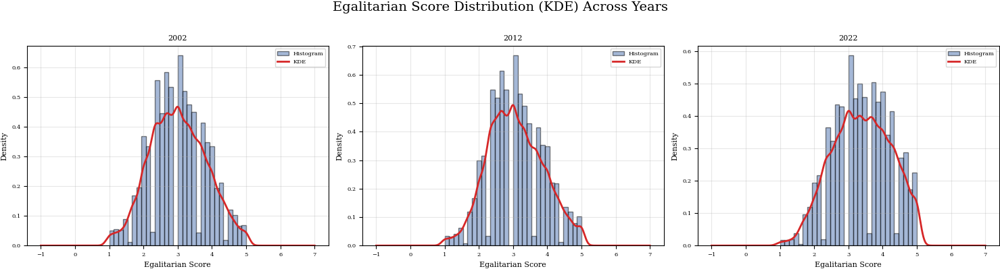

In [368]:
# KDE Plot
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
fig.suptitle('Egalitarian Score Distribution (KDE) Across Years', fontsize=14, y=1.02)

for idx, (data, year) in enumerate([(df_2002, 2002), (df_2012, 2012), (df_2022, 2022)]):
    clean = data.dropna(subset=["eg_score"])
    
    axes[idx].hist(clean["eg_score"], bins=30, alpha=0.5, color='#4c72b0', edgecolor='black', density=True, label='Histogram')
    clean["eg_score"].plot(kind='kde', ax=axes[idx], color='#d62728', linewidth=2, label='KDE')
    axes[idx].set_title(f"{year}")
    axes[idx].set_xlabel("Egalitarian Score")
    axes[idx].set_ylabel("Density")
    axes[idx].legend()
    axes[idx].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [369]:
# Summary statistics for eg_score
eg_stats = []
for data, year in [(df_2002, 2002), (df_2012, 2012), (df_2022, 2022)]:
    clean = data.dropna(subset=["eg_score"])
    eg_stats.append({
        'Year': year,
        'Mean': f"{clean['eg_score'].mean():.2f}",
        'Median': f"{clean['eg_score'].median():.2f}",
        'Std Dev': f"{clean['eg_score'].std():.2f}",
        'Min': f"{clean['eg_score'].min():.2f}",
        'Max': f"{clean['eg_score'].max():.2f}",
        'Count': len(clean)
    })

eg_stats_df = pd.DataFrame(eg_stats)
eg_stats_df

,Year,Mean,Median,Std Dev,Min,Max,Count
0,2002,3.01,3.00,0.82,1.00,5.00,26949
1,2012,3.07,3.00,0.81,1.00,5.00,32594
2,2022,3.38,3.33,0.86,1.00,5.00,22619


### Analysis on Household members

In [370]:
# Create HHADULT for 2012 by subtracting children and toddlers from home population
df_2012['HHADULT'] = df_2012['HOMPOP'] - df_2012['HHCHILDR'] - df_2012['HHTODD']
df_2012=df_2012[df_2012['HHADULT']>0]

# Check the new column
print("2012 HHADULT statistics:")
print(df_2012['HHADULT'].describe())
print(f"\nUnique values: {sorted(df_2012['HHADULT'].dropna().unique())}")

2012 HHADULT statistics:
count    32286.000000
mean         2.555938
std          1.131640
min          1.000000
25%          2.000000
50%          2.000000
75%          3.000000
max         36.000000
Name: HHADULT, dtype: float64

Unique values: [np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0), np.float64(5.0), np.float64(6.0), np.float64(7.0), np.float64(8.0), np.float64(9.0), np.float64(10.0), np.float64(11.0), np.float64(12.0), np.float64(13.0), np.float64(14.0), np.float64(15.0), np.float64(17.0), np.float64(18.0), np.float64(19.0), np.float64(20.0), np.float64(22.0), np.float64(25.0), np.float64(36.0)]


In [371]:
# Distribution of number of adults in household across years
fig = make_subplots(rows=1, cols=3, subplot_titles=("2002", "2012", "2022"))

# Find the range of HHADULT values across all years (starting from 1)
all_values = []
for data in [df_2002, df_2012, df_2022]:
    all_values.extend(data['HHADULT'].dropna().unique())
x_categories = sorted([x for x in set(all_values) if x >= 1])

for idx, (data, year) in enumerate([(df_2002, "2002"), (df_2012, "2012"), (df_2022, "2022")], start=1):
    clean = data.dropna(subset=["HHADULT"])
    
    # Calculate value counts and percentages
    value_counts = clean['HHADULT'].value_counts()
    total = value_counts.sum()
    percentages = (value_counts / total * 100).reindex(x_categories, fill_value=0)
    
    # Filter out zero percentages
    non_zero_data = percentages[percentages > 0]
    
    fig.add_trace(
        go.Bar(
            x=non_zero_data.index,
            y=non_zero_data.values,
            marker_color="#4c72b0",
            text=[f"{v:.1f}%" for v in non_zero_data.values],
            textposition="outside"
        ),
        row=1, col=idx
    )

fig.update_layout(
    height=500, width=1500,
    showlegend=False,
    title='Distribution of Number of Adults in Household Across Years'
)
fig.update_xaxes(title_text="Number of Adults", categoryorder="array", categoryarray=x_categories)
fig.update_yaxes(title_text="Percentage")
fig.show()

Apparently, the dataset contains households with greater than 15 people.

In [372]:
df_2002[df_2002['HHADULT']>15][['HOMPOP', 'HHADULT', 'HHCHILDR', 'HHTODD']]

,HOMPOP,HHADULT,HHCHILDR,HHTODD
45446,24.0,17.0,6.0,1.0


In [373]:
df_2012[df_2012['HHADULT']>30][['HOMPOP', 'HHADULT', 'HHCHILDR', 'HHTODD']]

,HOMPOP,HHADULT,HHCHILDR,HHTODD
26197,37.0,36.0,1.0,0.0


In [374]:
df_2022[df_2022['HHADULT']>20][['HOMPOP', 'HHADULT', 'HHCHILDR', 'HHTODD']]

,HOMPOP,HHADULT,HHCHILDR,HHTODD
9790,2.0,22.0,0.0,0.0


Clearly these are erroneous values and will not be considered in the analysis

## Egalitarian Score by Age

In [375]:

correlations = []
for data, year in [(df_2002, 2002), (df_2012, 2012), (df_2022, 2022)]:
    clean = data.dropna(subset=["age", "eg_score_normalized"])
    corr = clean['age'].corr(clean['eg_score_normalized'])
    correlations.append({
        'Year': year,
        'Correlation': f"{corr:.4f}",
        'Sample Size': len(clean)
    })

corr_df = pd.DataFrame(correlations)
corr_df

KeyError: ['eg_score_normalized']

### EDA on Education

In [ ]:
# Gender distribution within each education level
fig = make_subplots(rows=1, cols=3, subplot_titles=("2002", "2012", "2022"))

educ_order = ['No/Primary', 'Secondary', 'Post-sec / Short tertiary', 'University+']

for idx, (data, year) in enumerate([(df_2002, "2002"), (df_2012, "2012"), (df_2022, "2022")], start=1):
    clean = data.dropna(subset=["educ_4_label", "sex"])
    
    # Calculate percentage by education level
    educ_sex = clean.groupby(['educ_4_label', 'sex']).size().unstack(fill_value=0)
    educ_sex_pct = educ_sex.div(educ_sex.sum(axis=1), axis=0) * 100
    educ_sex_pct = educ_sex_pct.reindex(educ_order, fill_value=0)
    
    for gender in ['Female', 'Male']:
        if gender in educ_sex_pct.columns:
            fig.add_trace(
                go.Bar(
                    name=gender,
                    x=educ_sex_pct.index,
                    y=educ_sex_pct[gender],
                    marker_color=gender_color_map[gender],
                    showlegend=(idx == 1)
                ),
                row=1, col=idx
            )

fig.update_layout(
    height=500, width=1800,
    barmode='stack',
    title='Gender Distribution within Each Education Level Across Years'
)
fig.update_xaxes(title_text="Education Level", tickangle=45)
fig.update_yaxes(title_text="Percentage", range=[0, 100])
fig.show()

In [ ]:
# Education level distribution by gender
fig = make_subplots(rows=1, cols=3, subplot_titles=("2002", "2012", "2022"))

educ_order = ['No/Primary', 'Secondary', 'Post-sec / Short tertiary', 'University+']

for idx, (data, year) in enumerate([(df_2002, "2002"), (df_2012, "2012"), (df_2022, "2022")], start=1):
    clean = data.dropna(subset=["educ_4_label", "sex"])
    
    for gender in ["Female", "Male"]:
        gender_data = clean[clean["sex"] == gender]["educ_4_label"]
        value_counts = gender_data.value_counts()
        total = value_counts.sum()
        percentages = (value_counts / total * 100).reindex(educ_order, fill_value=0)
        
        fig.add_trace(
            go.Bar(
                x=percentages.index,
                y=percentages.values,
                name=gender,
                marker_color=gender_color_map[gender],
                opacity=0.7,
                showlegend=(idx == 1),
                text=[f"{v:.1f}%" for v in percentages.values],
                textposition="outside"
            ),
            row=1, col=idx
        )

fig.update_layout(
    height=500, width=1800,
    barmode='group',
    title='Education Level Distribution by Gender Across Years'
)
fig.update_xaxes(title_text="Education Level", tickangle=45)
fig.update_yaxes(title_text="Percentage")
fig.show()

In [ ]:
# Education level distribution across years
fig = make_subplots(rows=1, cols=3, subplot_titles=("2002", "2012", "2022"))

# Define education level order from lowest to highest
educ_order = ['No/Primary', 'Secondary', 'Post-sec / Short tertiary', 'University+']

for idx, (data, year) in enumerate([(df_2002, "2002"), (df_2012, "2012"), (df_2022, "2022")], start=1):
    clean = data.dropna(subset=["educ_4_label"])
    
    # Calculate value counts and percentages
    value_counts = clean['educ_4_label'].value_counts()
    total = value_counts.sum()
    percentages = (value_counts / total * 100).reindex(educ_order, fill_value=0)
    
    fig.add_trace(
        go.Bar(
            x=percentages.index,
            y=percentages.values,
            marker_color="#4c72b0",
            text=[f"{v:.1f}%" for v in percentages.values],
            textposition="outside"
        ),
        row=1, col=idx
    )

fig.update_layout(
    height=500, width=1800,
    showlegend=False,
    title='Education Level Distribution Across Years'
)
fig.update_xaxes(title_text="Education Level", tickangle=45)
fig.update_yaxes(title_text="Percentage")
fig.show()

In [ ]:
# Age distribution by education level (box plots)
fig = make_subplots(rows=1, cols=3, subplot_titles=("2002", "2012", "2022"))

educ_order = ['No/Primary', 'Secondary', 'Post-sec / Short tertiary', 'University+']

for idx, (data, year) in enumerate([(df_2002, "2002"), (df_2012, "2012"), (df_2022, "2022")], start=1):
    clean = data.dropna(subset=["age", "educ_4_label"]).copy()
    clean['educ_4_label'] = pd.Categorical(clean['educ_4_label'], categories=educ_order, ordered=True)
    clean = clean.sort_values('educ_4_label')
    
    fig.add_trace(
        go.Box(
            y=clean['age'],
            x=clean['educ_4_label'],
            name=year,
            marker_color='#4c72b0',
            showlegend=False
        ),
        row=1, col=idx
    )

fig.update_layout(
    height=600, width=2200,
    title='Age Distribution by Education Level Across Years',
)
fig.update_xaxes(title_text="Education Level")
fig.update_yaxes(title_text="Age")
fig.show()

In [ ]:
# Age distribution by education level - separated by gender
fig = make_subplots(rows=2, cols=3, subplot_titles=(
    "2002 - Female", "2012 - Female", "2022 - Female",
    "2002 - Male", "2012 - Male", "2022 - Male"
), vertical_spacing=0.15)

educ_order = ['No/Primary', 'Secondary', 'Post-sec / Short tertiary', 'University+']
gender_colors = {"Female": "#ff69b4", "Male": "#4169e1"}

for gender_idx, gender in enumerate(['Female', 'Male'], start=1):
    for col_idx, (data, year) in enumerate([(df_2002, "2002"), (df_2012, "2012"), (df_2022, "2022")], start=1):
        clean = data.dropna(subset=["age", "educ_4_label", "sex"]).copy()
        clean = clean[clean['sex'] == gender]
        clean['educ_4_label'] = pd.Categorical(clean['educ_4_label'], categories=educ_order, ordered=True)
        clean = clean.sort_values('educ_4_label')
        
        fig.add_trace(
            go.Box(
                y=clean['age'],
                x=clean['educ_4_label'],
                name=gender,
                
                marker_color=gender_colors[gender],
                showlegend=(col_idx == 1 and gender_idx == 1),
                hovertemplate=f"{gender}<br>Education=%{{x}}<br>Age=%{{y}}<extra>{year}</extra>"
            ),
            row=gender_idx, col=col_idx
        )

fig.update_layout(
    height=1500, width=2200,
    title='Age Distribution by Education Level and Gender Across Years',
)
fig.update_xaxes(title_text="Education Level", tickangle=45)
fig.update_yaxes(title_text="Age")
fig.show()

In [ ]:
# Age mix within education levels (stacked percentages) — clean re-run
fig = make_subplots(rows=1, cols=3, subplot_titles=("2002", "2012", "2022"))

age_labels = ["18-25", "26-35", "36-45", "46-55", "56-65", "66-75", "75+"]
educ_order = ['No/Primary', 'Secondary', 'Post-sec / Short tertiary', 'University+']
age_colors = {
    '18-25': '#4c78a8',
    '26-35': '#f28e2b',
    '36-45': '#59a14f',
    '46-55': '#e15759',
    '56-65': '#b07aa1',
    '66-75': '#9c755f',
    '75+': '#edc948'
}

for idx, (data, year) in enumerate([(df_2002, "2002"), (df_2012, "2012"), (df_2022, "2022")], start=1):
    clean = data.dropna(subset=["age_bin", "educ_4_label"]).copy()
    clean['age_bin'] = pd.Categorical(clean['age_bin'], categories=age_labels, ordered=True)
    clean['educ_4_label'] = pd.Categorical(clean['educ_4_label'], categories=educ_order, ordered=True)

    educ_age = clean.groupby(['educ_4_label', 'age_bin']).size().unstack(fill_value=0)
    educ_age_pct = educ_age.div(educ_age.sum(axis=1), axis=0).reindex(educ_order)

    for age_group in age_labels:
        fig.add_trace(
            go.Bar(
                name=age_group,
                x=educ_age_pct.index,
                y=educ_age_pct[age_group] * 100,
                marker_color=age_colors[age_group],
                showlegend=(idx == 1)
            ),
            row=1, col=idx
        )

fig.update_layout(
    height=550, width=2000,
    barmode='stack',
    title='Age Group Distribution within Education Levels Across Years',
    legend_title_text='Age Group'
)
fig.update_xaxes(title_text="Education Level", tickangle=45)
fig.update_yaxes(title_text="Percentage", range=[0, 100])
fig.show()

/var/folders/7h/y6lh43p93vl_bgy8rc2z416c0000gn/T/ipykernel_1759/2754996400.py:21: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/7h/y6lh43p93vl_bgy8rc2z416c0000gn/T/ipykernel_1759/2754996400.py:21: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/7h/y6lh43p93vl_bgy8rc2z416c0000gn/T/ipykernel_1759/2754996400.py:21: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [ ]:
# Reverse TOPBOT scale for Norway (NO): new_TOPBOT = 11 - old_TOPBOT
# This transforms the scale so that 1 becomes 10, 10 becomes 1, etc.

for data in [df_2002, df_2012, df_2022]:
    norway_mask = data['country'] == 'NO'
    data.loc[norway_mask & data['TOPBOT'].notna(), 'TOPBOT'] = 11 - data.loc[norway_mask & data['TOPBOT'].notna(), 'TOPBOT']


## TOPBOT (subjective social status 1–10)

- Distribution across waves (counts with mean markers)
- Relationship with education (mean scores)
- Country × gender comparison (mean scores, top sampled countries)

In [ ]:
# TOPBOT distribution (1–10) across years (percent)
fig = make_subplots(rows=1, cols=3, subplot_titles=("2002", "2012", "2022"))

bin_config = dict(start=0.5, end=10.5, size=1)
color_main = "#4c72b0"
marker_mean = dict(color="#e15759", width=2, dash="dash")

for idx, (data, year) in enumerate([(df_2002, "2002"), (df_2012, "2012"), (df_2022, "2022")], start=1):
    clean = data.dropna(subset=["TOPBOT"])
    mean_val = clean["TOPBOT"].mean()

    fig.add_trace(
        go.Histogram(
            x=clean["TOPBOT"],
            xbins=bin_config,
            histnorm="percent",
            marker_color=color_main,
            opacity=0.75,
            showlegend=False,
            texttemplate="%{y:.1f}%",
            hovertemplate="TOPBOT=%{x}<br>%{y:.1f}% of respondents<extra>" + year + "</extra>"
        ),
        row=1, col=idx
    )

    fig.add_shape(
        type="line",
        x0=mean_val, x1=mean_val, y0=0, y1=1,
        xref=f"x{idx}", yref="paper",
        line=marker_mean
    )
    fig.add_annotation(
        x=mean_val, y=1.05,
        xref=f"x{idx}", yref="paper",
        text=f"Mean {mean_val:.2f}",
        showarrow=False,
        font=dict(color=marker_mean["color"])
    )

fig.update_layout(
    height=700, width=2000,
    title="TOPBOT distribution (1=lowest status, 10=highest)",
    bargap=0.05,
    margin=dict(t=60, b=50)
)
fig.update_xaxes(title_text="TOPBOT score", dtick=1)
fig.update_yaxes(title_text="Percentage of respondents", range=[0, 100])
fig.show()


In [ ]:
# TOPBOT distribution by education level (box plots)
fig = make_subplots(rows=1, cols=3, subplot_titles=("2002", "2012", "2022"))

educ_order = ['No/Primary', 'Secondary', 'Post-sec / Short tertiary', 'University+']
educ_colors = {
    'No/Primary': '#4c78a8',
    'Secondary': '#f28e2b',
    'Post-sec / Short tertiary': '#59a14f',
    'University+': '#b07aa1'
}

for idx, (data, year) in enumerate([(df_2002, "2002"), (df_2012, "2012"), (df_2022, "2022")], start=1):
    clean = data.dropna(subset=["TOPBOT", "educ_4_label"]).copy()
    clean['educ_4_label'] = pd.Categorical(clean['educ_4_label'], categories=educ_order, ordered=True)

    for level in educ_order:
        subset = clean[clean['educ_4_label'] == level]
        if subset.empty:
            continue
        fig.add_trace(
            go.Box(
                y=subset['TOPBOT'],
                name=level,
                marker_color=educ_colors[level],
                boxmean=True,
                showlegend=(idx == 1),
                hovertemplate=f"Education={level}<br>TOPBOT=%{{y}}<extra>{year}</extra>"
            ),
            row=1, col=idx
        )

fig.update_layout(
    height=600, width=2000,
    boxmode='group',
    title="Social Status score distribution by education level",
    legend_title_text='Education level',
    margin=dict(t=60, b=80)
)
fig.update_yaxes(title_text="Social Status score", range=[0, 10])
fig.show()


In [ ]:
# Mean TOPBOT by country (all countries)
fig = make_subplots(rows=1, cols=3, subplot_titles=("2002", "2012", "2022"))

bar_color = "#4c72b0"

for idx, (data, year) in enumerate([(df_2002, "2002"), (df_2012, "2012"), (df_2022, "2022")], start=1):
    clean = data.dropna(subset=["TOPBOT", "country"])
    avg_topbot = clean.groupby('country')['TOPBOT'].mean().sort_values()

    fig.add_trace(
        go.Bar(
            x=avg_topbot.values,
            y=avg_topbot.index,
            orientation='h',
            marker_color=bar_color,
            text=[f"{v:.2f}" for v in avg_topbot.values],
            textposition='outside',
            showlegend=False,
            hovertemplate="Country=%{y}<br>Mean TOPBOT=%{x:.2f}<extra>" + year + "</extra>"
        ),
        row=1, col=idx
    )

fig.update_layout(
    height=900, width=2600,
    title="Mean TOPBOT by country (all countries)",
    margin=dict(t=60, b=40, r=120),
    bargap=0.2
)
fig.update_xaxes(title_text="Mean TOPBOT", range=[0, 10])
fig.update_yaxes(title_text="Country")
fig.show()


In [ ]:
# Normalize F1_score using min-max normalization
def min_max_normalize(series):
    """Min-max normalize to [0, 1] range"""
    min_val = series.min()
    max_val = series.max()
    if max_val == min_val:
        return pd.Series(0, index=series.index)
    return (series - min_val) / (max_val - min_val)

# Normalize F1_score for each dataframe
if 'F1_score' in df_2022.columns:
    df_2022['F1_score_norm'] = min_max_normalize(df_2022['F1_score'])
    print("df_2022 F1_score normalized")
    print(f"  Original range: [{df_2022['F1_score'].min():.3f}, {df_2022['F1_score'].max():.3f}]")
    print(f"  Normalized range: [{df_2022['F1_score_norm'].min():.3f}, {df_2022['F1_score_norm'].max():.3f}]")
    print(f"  Mean: {df_2022['F1_score_norm'].mean():.3f}\n")

In [ ]:
df_2012['F1_score_norm'] = min_max_normalize(df_2012['F1_score'])

KeyError: 'F1_score'

In [ ]:
df_2002['F1_score_norm'] = min_max_normalize(df_2002['F1_score'])

In [ ]:
# Egalitarian Score by Gender
fig = make_subplots(rows=1, cols=3, subplot_titles=("2002", "2012", "2022"))

gender_colors = {"Female": "#ff69b4", "Male": "#4169e1"}

for idx, (data, year) in enumerate([(df_2002, "2002"), (df_2012, "2012"), (df_2022, "2022")], start=1):
    clean = data.dropna(subset=["F1_score_norm", "sex"])
    
    for gender in ['Female', 'Male']:
        subset = clean[clean['sex'] == gender]
        if subset.empty:
            continue
        fig.add_trace(
            go.Box(
                y=subset['F1_score_norm'],
                name=gender,
                marker_color=gender_colors[gender],
                boxmean=True,
                showlegend=(idx == 1)
            ),
            row=1, col=idx
        )

fig.update_layout(
    height=600, width=1800,
    boxmode='group',
    title="Normalized Egalitarian Score Distribution by Gender",
    legend_title_text='Gender'
)
fig.update_yaxes(title_text="Normalized Egalitarian Score (0-1)", range=[0, 1])
fig.show()

In [ ]:
df_2002[df_2002['eg_score_norm']==df_2002['eg_score_norm'].min()]

,Unnamed: 0,v4_egal,v5_egal,v6_egal,v7_egal,v8_egal,v11_egal,v4_egal_z,v5_egal_z,v6_egal_z,...,HH_TIRED,HH_FAM,WORK_TIRED,HH_WEEKEND,COHAB,HOMPOP,COUNTRY,CASEID,eg_score_normalized,LIFE_HAP_numeric
115,115,1.0,1.0,1.0,1.0,1.0,1.0,-2.177771,-1.414755,-1.462772,...,Several times a month,NaN,Once or twice,About equal,NaN,2.0,Australia (AU),1000116,0.0,5.0
309,309,1.0,1.0,1.0,1.0,1.0,1.0,-2.177771,-1.414755,-1.462772,...,NAP,NaN,NAP,About equal,NaN,2.0,Australia (AU),1000310,0.0,5.0
1949,1949,1.0,1.0,1.0,1.0,1.0,1.0,-2.177771,-1.414755,-1.462772,...,NAP,NaN,NAP,About equal,NaN,5.0,Germany (West) (DE-W),2000598,0.0,6.0
2260,2260,1.0,1.0,1.0,1.0,1.0,1.0,-2.177771,-1.414755,-1.462772,...,NAP,NaN,NAP,About equal,NaN,2.0,Germany (West) (DE-W),2000909,0.0,5.0
4983,4983,1.0,1.0,1.0,1.0,1.0,1.0,-2.177771,-1.414755,-1.462772,...,Never,NaN,Never,About equal,NaN,2.0,Northern Ireland (GB-NIR),5000439,0.0,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42753,42753,1.0,1.0,1.0,1.0,1.0,1.0,-2.177771,-1.414755,-1.462772,...,NAP,NaN,NAP,Always partner,NaN,2.0,Finland (FI),37002746,0.0,5.0
42937,42937,1.0,1.0,1.0,1.0,1.0,1.0,-2.177771,-1.414755,-1.462772,...,NAP,NaN,NAP,About equal,NaN,2.0,Finland (FI),37003101,0.0,7.0
43016,43016,1.0,1.0,1.0,1.0,1.0,1.0,-2.177771,-1.414755,-1.462772,...,Never,NaN,Several times a month,About equal,NaN,2.0,Finland (FI),37003240,0.0,4.0
43504,43504,1.0,1.0,1.0,1.0,1.0,1.0,-2.177771,-1.414755,-1.462772,...,Never,NaN,Never,Always respondent,NaN,5.0,Mexico (MX),38000436,0.0,6.0


In [ ]:
# Egalitarian Score by Education Level
fig = make_subplots(rows=1, cols=3, subplot_titles=("2002", "2012", "2022"))

educ_order = ['No/Primary', 'Secondary', 'Post-sec / Short tertiary', 'University+']
educ_colors = {
    'No/Primary': '#4c78a8',
    'Secondary': '#f28e2b',
    'Post-sec / Short tertiary': '#59a14f',
    'University+': '#b07aa1'
}

for idx, (data, year) in enumerate([(df_2002, "2002"), (df_2012, "2012"), (df_2022, "2022")], start=1):
    clean = data.dropna(subset=["eg_score_normalized", "educ_4_label"]).copy()
    clean['educ_4_label'] = pd.Categorical(clean['educ_4_label'], categories=educ_order, ordered=True)
    
    avg_eg = clean.groupby('educ_4_label')['eg_score_normalized'].mean().reindex(educ_order)
    
    fig.add_trace(
        go.Bar(
            x=avg_eg.index,
            y=avg_eg.values,
            marker_color=[educ_colors[level] for level in avg_eg.index],
            text=[f"{v:.3f}" for v in avg_eg.values],
            textposition="outside",
            showlegend=False
        ),
        row=1, col=idx
    )

fig.update_layout(
    height=600, width=2000,
    title="Mean Normalized Egalitarian Score by Education Level",
    margin=dict(t=60, b=100)
)
fig.update_xaxes(title_text="Education Level", tickangle=40)
fig.update_yaxes(title_text="Mean Normalized Egalitarian Score", range=[0, 1])
fig.show()

/var/folders/7h/y6lh43p93vl_bgy8rc2z416c0000gn/T/ipykernel_83017/2740047222.py:16: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/7h/y6lh43p93vl_bgy8rc2z416c0000gn/T/ipykernel_83017/2740047222.py:16: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/7h/y6lh43p93vl_bgy8rc2z416c0000gn/T/ipykernel_83017/2740047222.py:16: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [ ]:
# TOPBOT-Happiness Correlation Scatter
fig = make_subplots(rows=1, cols=3, subplot_titles=("2002", "2012", "2022"))

for idx, (data, year) in enumerate([(df_2002, "2002"), (df_2012, "2012"), (df_2022, "2022")], start=1):
    clean = data.dropna(subset=["TOPBOT", "LIFE_HAP_numeric"])
    
    # Calculate correlation
    corr = clean['TOPBOT'].corr(clean['LIFE_HAP_numeric'])
    
    fig.add_trace(
        go.Scatter(
            x=clean['TOPBOT'],
            y=clean['LIFE_HAP_numeric'],
            mode='markers',
            marker=dict(
                color='#4c72b0',
                size=3,
                opacity=0.3
            ),
            name=f'{year} (r={corr:.3f})',
            showlegend=False
        ),
        row=1, col=idx
    )
    
    # Add trend line
    z = np.polyfit(clean['TOPBOT'], clean['LIFE_HAP_numeric'], 1)
    p = np.poly1d(z)
    x_trend = np.linspace(clean['TOPBOT'].min(), clean['TOPBOT'].max(), 100)
    y_trend = p(x_trend)
    
    fig.add_trace(
        go.Scatter(
            x=x_trend,
            y=y_trend,
            mode='lines',
            line=dict(color='#d62728', width=3),
            name=f'Trend (r={corr:.3f})',
            showlegend=False
        ),
        row=1, col=idx
    )
    
    # Add correlation annotation (use subplot domain coordinates)
    fig.add_annotation(
        x=0.5, y=0.95,
        xref=("x domain" if idx == 1 else f"x{idx} domain"),
        yref=("y domain" if idx == 1 else f"y{idx} domain"),
        text=f"r = {corr:.3f}",
        showarrow=False,
        font=dict(size=14, color='#d62728'),
        bgcolor='white',
        bordercolor='#d62728',
        borderwidth=2
    )

fig.update_layout(
    height=500, width=2000,
    title="Relationship between TOPBOT (Social Status) and Happiness",
    margin=dict(t=60, b=50)
)
fig.update_xaxes(title_text="TOPBOT Score", range=[0, 11])
fig.update_yaxes(title_text="Happiness Score", range=[0, 8])
fig.show()

In [ ]:
# Egalitarian Score by Gender and Country (top 10 countries)
fig = make_subplots(rows=1, cols=3, subplot_titles=("2002", "2012", "2022"))

gender_colors = {"Female": "#ff69b4", "Male": "#4169e1"}

for idx, (data, year) in enumerate([(df_2002, "2002"), (df_2012, "2012"), (df_2022, "2022")], start=1):
    clean = data.dropna(subset=["eg_score_normalized", "sex", "country"])
    top_countries = clean['country'].value_counts().head(10).index
    filtered = clean[clean['country'].isin(top_countries)]
    
    eg_country_sex = filtered.groupby(['country', 'sex'])['eg_score_normalized'].mean().unstack()
    eg_country_sex = eg_country_sex.loc[top_countries]
    
    for gender in ['Female', 'Male']:
        if gender in eg_country_sex.columns:
            fig.add_trace(
                go.Bar(
                    name=gender,
                    x=eg_country_sex.index,
                    y=eg_country_sex[gender],
                    marker_color=gender_colors[gender],
                    opacity=0.8,
                    text=[f"{v:.3f}" for v in eg_country_sex[gender]],
                    textposition="outside",
                    showlegend=(idx == 1)
                ),
                row=1, col=idx
            )

fig.update_layout(
    height=650, width=2400,
    barmode='group',
    title="Mean Normalized Egalitarian Score by Gender (Top 10 Countries)",
    margin=dict(t=60, b=180)
)
fig.update_xaxes(title_text="Country", tickangle=80)
fig.update_yaxes(title_text="Mean Normalized Egalitarian Score", range=[0, 1])
fig.show()

In [ ]:
## Mapping questions and variable names
v_map_2002={
    'v4_egal': 'item1',
    'v5_egal': 'item2',
    'v6_egal': 'item3',
    'v7_egal': 'item4',
    'v8_egal': 'item5',
    'v11_egal': 'item6',
}
v_map_2012={
    'V5_egal': 'item1',
    'V6_egal': 'item2',
    'V7_egal': 'item3',
    'V8_egal': 'item4',
    'V9_egal': 'item5',
    'V11_egal': 'item6',
}
v_map_2022 = {
    'v1_egal': 'item1',
    'v2_egal': 'item2',
    'v3_egal': 'item3',
    'v4_egal': 'item4',
    'v5_egal': 'item5',
    'v6_egal': 'item6',
}

Combined explained variance (%): [45.65 18.17 11.32 10.71  7.97  6.19]


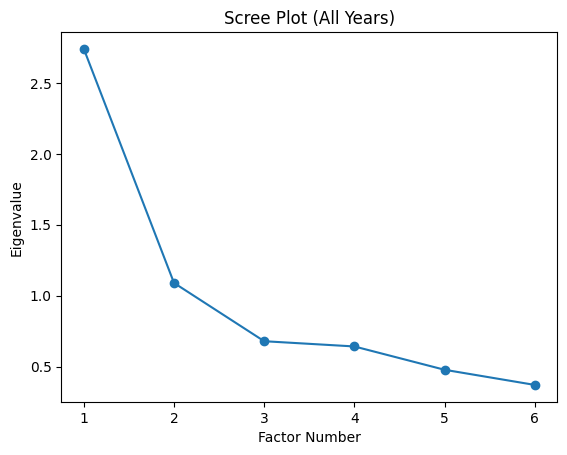

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Map per-year columns to a common set
a_items = ['item1', 'item2', 'item3', 'item4', 'item5', 'item6']


# Select, rename, and tag year
pca_2002 = df_2002[v_map_2002.keys()].rename(columns=v_map_2002).assign(year=2002)
pca_2012 = df_2012[v_map_2012.keys()].rename(columns=v_map_2012).assign(year=2012)
pca_2022 = df_2022[v_map_2022.keys()].rename(columns=v_map_2022).assign(year=2022)

# Combine and drop rows with any missing in the six items
combined_pca = pd.concat([pca_2002, pca_2012, pca_2022], axis=0, ignore_index=True)
combined_pca = combined_pca.dropna(subset=a_items)

X = combined_pca[a_items].values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

pca = PCA()
pca.fit(X_scaled)

eigenvalues = pca.explained_variance_
explained_pct = pca.explained_variance_ratio_ * 100
print('Combined explained variance (%):', np.round(explained_pct, 2))

plt.figure()
plt.plot(range(1, len(eigenvalues) + 1), eigenvalues, marker='o')
plt.xlabel('Factor Number')
plt.ylabel('Eigenvalue')
plt.title('Scree Plot (All Years)')
plt.show()

### Determination of the Number of Factors

The number of factors to retain was determined using two commonly used criteria:

- **Kaiser Criterion**:  
  According to the Kaiser criterion, only factors with eigenvalues greater than 1 should be retained. In our analysis, two factors had eigenvalues exceeding 1.

- **Scree Plot Inspection**:  
  Visual inspection of the scree plot shows a clear elbow at the second factor, after which the eigenvalues level off. 

Based on both the Kaiser criterion and the scree plot, **two latent dimensions** are considered for the data


In [376]:
import numpy as np
import pandas as pd
from typing import Optional, List, Dict
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from factor_analyzer import FactorAnalyzer
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity, calculate_kmo

def make_dfs(df, item_cols):
    X = df[item_cols].copy()
    
    for c in X.columns:
        X[c] = pd.to_numeric(X[c], errors="coerce")

    X = X.dropna(axis=0)    
    return X

def prepare_items_df(
    df: pd.DataFrame,
    item_cols: List[str],
    *,
    special_missing_codes: Optional[set] = None,
    min_complete_rate: float = 0.7,
) -> pd.DataFrame:
    """
    Returns numeric-only items dataframe with missing handled.
    """
    X = df[item_cols].copy()

    # Convert to numeric
    for c in X.columns:
        X[c] = pd.to_numeric(X[c], errors="coerce")

    if special_missing_codes is not None:
        for c in X.columns:
            X.loc[X[c].isin(special_missing_codes), c] = np.nan

    # Drop items with too much missingness
    keep = X.columns[X.notna().mean() >= min_complete_rate].tolist()
    X = X[keep]

    # Complete-case analysis
    X = X.dropna(axis=0)

    return X


def factor_analysis_prechecks(X):
    chi2, p = calculate_bartlett_sphericity(X.values)
    kmo_all, kmo_model = calculate_kmo(X.values)
    return {
        "bartlett_chi2": chi2,
        "bartlett_p": p,
        "kmo_model": float(kmo_model),
        "kmo_item_mean": float(np.mean(kmo_all)),
    }


def factor_analysis(X,n_factors,rotation: Optional[str] = None,method: str = "principal",standardize: bool = True,):
    """
    Returns loadings, factor scores, and variance explained
    """
    X_in = X.copy()

    if standardize:
        scaler = StandardScaler()
        Z = scaler.fit_transform(X_in.values)
        Z = pd.DataFrame(Z, columns=X_in.columns, index=X_in.index)
    else:
        Z = X_in

    fa = FactorAnalyzer(n_factors=n_factors, rotation=rotation, method=method)
    fa.fit(Z.values)

    # Loadings
    loadings = pd.DataFrame(
        fa.loadings_,
        index=Z.columns,
        columns=[f"F{i+1}" for i in range(n_factors)]
    )

    # Communalities + uniqueness
    communalities = pd.Series(fa.get_communalities(), index=Z.columns, name="communality")
    uniqueness = pd.Series(fa.get_uniquenesses(), index=Z.columns, name="uniqueness")

    # Variance explained
    var, prop_var, cum_var = fa.get_factor_variance()
    variance_explained = pd.DataFrame(
        {
            "variance": var,
            "prop_variance": prop_var,
            "cum_prop_variance": cum_var,
        },
        index=[f"F{i+1}" for i in range(n_factors)]
    )

    # Factor scores
    scores = fa.transform(Z.values)
    factor_scores = pd.DataFrame(
        scores,
        index=Z.index,
        columns=[f"F{i+1}_score" for i in range(n_factors)]
    )

    return {
        "Z": Z,
        "fa": fa,
        "loadings": loadings,
        "communalities": communalities,
        "uniqueness": uniqueness,
        "variance_explained": variance_explained,
        "factor_scores": factor_scores,
    }


def cronbach_alpha(X):
    """
    Cronbach's alpha for reliability
    """
    Xv = X.values
    item_vars = Xv.var(axis=0, ddof=1)
    total_var = Xv.sum(axis=1).var(ddof=1)
    k = X.shape[1]
    if k < 2 or total_var == 0:
        return np.nan
    return float((k / (k - 1)) * (1 - item_vars.sum() / total_var))

In [377]:
## Factor Analysis for 2002
def do_factor_analysis(df,item_cols,n_factors=2, rotation=None, method="principal", standardize=True):
    X=make_dfs(df,item_cols)
    precheck=factor_analysis_prechecks(X)

    print(f"  Bartlett's χ²: {precheck['bartlett_chi2']:.2f}, p-value: {precheck['bartlett_p']:.4f}")
    print(f"  KMO: {precheck['kmo_model']:.4f}")

    if precheck['bartlett_p']>0.05:
        print("Data not suitable for Factor Analysis")
        return
    
    print("Factor Analysis can be conducted")
    fa=factor_analysis(X, n_factors, rotation, method, standardize)
    print("Variance Explained:")
    print(fa["variance_explained"])
    print("\nFactor Loadings (sorted by magnitude):")
    print(fa["loadings"].sort_values("F1", key=lambda s: s.abs(), ascending=False))
    print("\nCommunalities")
    print(fa['communalities'])

    alpha_2022 = cronbach_alpha(fa["Z"])
    print(f"Cronbach's Alpha: {alpha_2022:.3f}")
    
    df.join(fa["factor_scores"], how="left")
    return df

    

In [378]:
df_2002_f1=do_factor_analysis(df_2002,item_cols=[v for v in v_map_2002.keys()])

  Bartlett's χ²: 30631.71, p-value: 0.0000
  KMO: 0.7646
Factor Analysis can be conducted
Variance Explained:
    variance  prop_variance  cum_prop_variance
F1  2.617256       0.436209           0.436209
F2  1.106936       0.184489           0.620699

Factor Loadings (sorted by magnitude):
                F1        F2
v5_egal   0.760889 -0.304625
v6_egal   0.758435 -0.307157
v11_egal  0.716912  0.252582
v7_egal   0.682192  0.374368
v4_egal   0.526118 -0.521986
v8_egal   0.454896  0.665866

Communalities
v4_egal     0.549269
v5_egal     0.671749
v6_egal     0.669569
v7_egal     0.605538
v8_egal     0.650307
v11_egal    0.577761
Name: communality, dtype: float64
Cronbach's Alpha: 0.731


/Users/rashikakukreja/Masters/Data Literacy/Project/ML4102/.env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/Users/rashikakukreja/Masters/Data Literacy/Project/ML4102/.env/lib/python3.9/site-packages/sklearn/utils/extmath.py:335: RuntimeWarning:

divide by zero encountered in matmul

/Users/rashikakukreja/Masters/Data Literacy/Project/ML4102/.env/lib/python3.9/site-packages/sklearn/utils/extmath.py:335: RuntimeWarning:

overflow encountered in matmul

/Users/rashikakukreja/Masters/Data Literacy/Project/ML4102/.env/lib/python3.9/site-packages/sklearn/utils/extmath.py:335: RuntimeWarning:

invalid value encountered in matmul

/Users/rashikakukreja/Masters/Data Literacy/Project/ML4102/.env/lib/python3.9/site-packages/sklearn/utils/extmath.py:336: RuntimeWarning:

divide by zero encountered in matmul

/Users/rashikakukreja/Masters/Data Literacy/Project/ML4102/.env/lib

In [ ]:
# Apply to your data - 2022 example
# Get all numeric columns for factor analysis
numeric_cols = df_2022.select_dtypes(include=[np.number]).columns.tolist()
print(f"Found {len(numeric_cols)} numeric columns")
cols=['age','HOMPOP', 'HHCHILDR','HHTODD']
egal_cols = [col for col in df_2022.columns if col.endswith('_egal') and col.startswith('v')]
# Prepare data (will convert to numeric and filter by completeness)
X_2022 = prepare_items_df(df_2022, egal_cols, min_complete_rate=0.7)
print(f"\nPrepared data: {X_2022.shape[0]} cases, {X_2022.shape[1]} items")
print(f"Items included: {X_2022.columns.tolist()}")

Found 32 numeric columns

Prepared data: 20525 cases, 6 items
Items included: ['v1_egal', 'v2_egal', 'v3_egal', 'v4_egal', 'v5_egal', 'v6_egal']


In [ ]:
# Check factorability
checks = factorability_checks(X_2022)
print("Factorability Diagnostics:")
print(f"  Bartlett's χ²: {checks['bartlett_chi2']:.2f}, p-value: {checks['bartlett_p']:.4f}")
print(f"  KMO: {checks['kmo_model']:.3f} (>0.6 is good)")

Factorability Diagnostics:
  Bartlett's χ²: 35100.51, p-value: 0.0000
  KMO: 0.786 (>0.6 is good)


In [ ]:

# Run Factor Analysis (single factor for egalitarian construct)
fa_2022 = run_factor_analysis(X_2022, n_factors=2, rotation=None, method="principal", standardize=True)

print("Variance Explained:")
print(fa_2022["variance_explained"])
print("\nFactor Loadings (sorted by magnitude):")
print(fa_2022["loadings"].sort_values("F1", key=lambda s: s.abs(), ascending=False))

Variance Explained:
    variance  prop_variance  cum_prop_variance
F1  2.873007       0.478835           0.478835
F2  1.101278       0.183546           0.662381

Factor Loadings (sorted by magnitude):
               F1        F2
v2_egal  0.786011 -0.258201
v6_egal  0.776636  0.211824
v3_egal  0.774980 -0.286588
v4_egal  0.758855  0.307217
v1_egal  0.524306 -0.555012
v5_egal  0.447971  0.710765


/Users/rashikakukreja/Masters/Data Literacy/Project/ML4102/.env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/Users/rashikakukreja/Masters/Data Literacy/Project/ML4102/.env/lib/python3.9/site-packages/sklearn/utils/extmath.py:335: RuntimeWarning:

divide by zero encountered in matmul

/Users/rashikakukreja/Masters/Data Literacy/Project/ML4102/.env/lib/python3.9/site-packages/sklearn/utils/extmath.py:335: RuntimeWarning:

overflow encountered in matmul

/Users/rashikakukreja/Masters/Data Literacy/Project/ML4102/.env/lib/python3.9/site-packages/sklearn/utils/extmath.py:335: RuntimeWarning:

invalid value encountered in matmul

/Users/rashikakukreja/Masters/Data Literacy/Project/ML4102/.env/lib/python3.9/site-packages/sklearn/utils/extmath.py:336: RuntimeWarning:

divide by zero encountered in matmul

/Users/rashikakukreja/Masters/Data Literacy/Project/ML4102/.env/lib

KeyError: "['F1_score'] not in index"

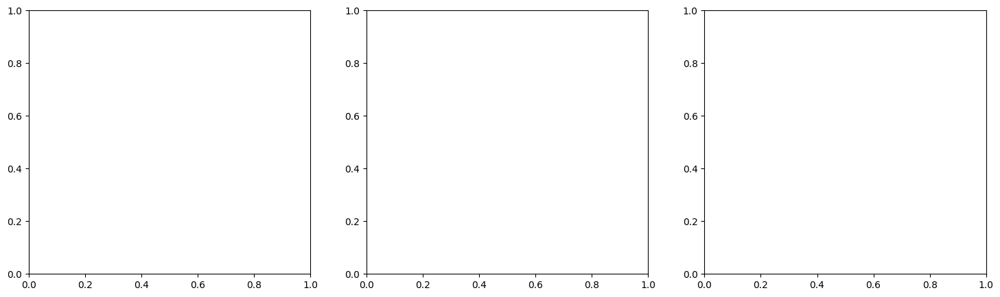

In [ ]:
# Compare factor scores vs. your original eg_score
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for ax, year, df in zip(axes, [2002, 2012, 2022], [df_2002, df_2012, df_2022]):
    # Plot only where both exist
    plot_df = df[['eg_score', 'F1_score']].dropna()
    
    ax.scatter(plot_df['eg_score'], plot_df['F1_score'], alpha=0.3, s=10)
    ax.set_xlabel('Original eg_score (sum)')
    ax.set_ylabel('Factor Score (F1)')
    ax.set_title(f'{year} (r={plot_df.corr().iloc[0,1]:.3f})')
    ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

In [ ]:
df_2022_new=df_2022[['v1_egal','v2_egal', 'v3_egal','v4_egal','v5_egal', 'v6_egal']]

In [ ]:
df_2022_new

,v1_egal,v2_egal,v3_egal,v4_egal,v5_egal,v6_egal
3,1.0,2.0,2.0,1.0,1.0,1.0
4,5.0,5.0,4.0,5.0,5.0,5.0
6,5.0,2.0,1.0,2.0,1.0,4.0
9,5.0,1.0,1.0,3.0,1.0,3.0
11,5.0,4.0,4.0,5.0,5.0,5.0
...,...,...,...,...,...,...
45739,2.0,2.0,2.0,2.0,2.0,1.0
45745,2.0,5.0,5.0,4.0,2.0,4.0
45747,2.0,5.0,4.0,3.0,5.0,3.0
45757,2.0,2.0,3.0,1.0,4.0,1.0


In [ ]:
# Export df_2022_new to CSV
output_path = "../final_csv/df_2022_new.csv"
df_2022_new.to_csv(output_path, index=False)
print(f"Saved df_2022_new to {output_path}")

Saved df_2022_new to ../final_csv/df_2022_new.csv


In [ ]:
corr=df_2022[''].corr(numeric_only=True)

KeyError: ''

In [ ]:
corr[(corr[['v1_egal', 'v2_egal', 'v3_egal']]< 0) & (corr[['v4_egal', 'v5_egal', 'v6_egal']]>0)]

,v1_egal,v2_egal,v3_egal,v4_egal,v5_egal,v6_egal,v1_egal_z,v2_egal_z,v3_egal_z,v4_egal_z,...,HHCHILDR,HHADULT,SP_HH_FAM,SP_HH,HH_FAM,HOMPOP,CASEID,eg_score_normalized,LIFE_HAP_numeric,F1_score
v1_egal,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
v2_egal,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
v3_egal,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
v4_egal,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
v5_egal,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
v6_egal,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
v1_egal_z,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
v2_egal_z,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
v3_egal_z,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
v4_egal_z,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df_2022[['v1_egal', 'v2_egal', 'v3_egal','v4_egal', 'v5_egal', 'v6_egal']].corr()

,v1_egal,v2_egal,v3_egal,v4_egal,v5_egal,v6_egal
v1_egal,1.000000,0.390448,0.381227,0.228319,0.029668,0.285374
v2_egal,0.390448,1.000000,0.649040,0.437624,0.192276,0.457610
v3_egal,0.381227,0.649040,1.000000,0.436199,0.158566,0.454483
v4_egal,0.228319,0.437624,0.436199,1.000000,0.371818,0.593649
v5_egal,0.029668,0.192276,0.158566,0.371818,1.000000,0.333681
v6_egal,0.285374,0.457610,0.454483,0.593649,0.333681,1.000000


In [ ]:
df_2022['F1_score']

3       -2.283385
4        1.662034
6       -0.989925
9       -1.205524
11       1.441518
           ...   
45739   -1.772952
45745    0.558552
45747    0.321533
45757   -1.506737
45761    0.728002
Name: F1_score, Length: 22619, dtype: float64

In [ ]:
df_2022['eg_score_norm_rev']=1-df['eg_score_norm']

In [ ]:
df_2022[['eg_score_normalized', 'eg_score_norm', 'eg_score','F1_score']]

,eg_score_normalized,eg_score_norm,eg_score,F1_score
3,0.083333,0.083333,1.333333,-2.283385
4,0.958333,0.958333,4.833333,1.662034
6,0.375000,0.375000,2.500000,-0.989925
9,0.333333,0.333333,2.333333,-1.205524
11,0.916667,0.916667,4.666667,1.441518
...,...,...,...,...
45739,0.208333,0.208333,1.833333,-1.772952
45745,0.666667,0.666667,3.666667,0.558552
45747,0.666667,0.666667,3.666667,0.321533
45757,0.291667,0.291667,2.166667,-1.506737


In [ ]:
import numpy as np

group_stats = (
    df_2022.groupby("sex")["F1_score"]
      .agg(mean="mean", std="std", n="count")
)

group_stats["se"] = group_stats["std"] / np.sqrt(group_stats["n"])
group_stats["ci_lower"] = group_stats["mean"] - 1.96 * group_stats["se"]
group_stats["ci_upper"] = group_stats["mean"] + 1.96 * group_stats["se"]


KeyError: 'Column not found: F1_score'